<a href="https://colab.research.google.com/github/andreaafs100766/Sprint-01/blob/master/MVP_Netflix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a id="1.0"></a>
#### <b><span style='color:#B21010'>|</span> MVP - 📉EDA on Netflix Movies and TV Shows🍟

*OBS: Para mais detalhes sobre este dataset, consulte: https://www.kaggle.com/input/netflix-tv-shows-and-movies/credits.csv e https://www.kaggle.com/input/netflix-tv-shows-and-movies/titles.csv*


In [176]:
!pip install country_converter
!pip install matplotlib
!pip install seaborn
!pip install scikit-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## <b>1 <span style='color:#B21010'>||</span> Importando Bibliotecas</b>

In [178]:
# Importação de pacotes
import pandas as pd
import numpy as np
import requests
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import missingno as msno
import country_converter as counco

# nltk
import nltk
import ast
import random

from matplotlib import cm
from plotly.subplots import make_subplots

# visualization
from wordcloud import WordCloud
colors = ['#494BD3', '#E28AE2', '#F1F481', '#79DB80', '#DF5F5F',
              '#69DADE', '#C2E37D', '#E26580', '#D39F49', '#B96FE3']
from plotly.offline import init_notebook_mode, iplot



<a id="2"></a>
## <b>2 <span style='color:#B21010'>||</span> Carregando e explicando DataSet</b>

<a id="2.1"></a>
 ####  <b>2.1 <span style='color:#B21010'>|</span> Carregando DataSet

In [179]:
# Informa a URL de importação do dataset
def read_dataset():

    credits=pd.read_csv('https://raw.githubusercontent.com/andreaafs100766/Sprint-01/master/credits.csv')
    print('"credits.csv" imported successfully!')

    titles=pd.read_csv('https://raw.githubusercontent.com/andreaafs100766/Sprint-01/master/titles.csv')
    print('"titles.csv" imported successfully!')

    return credits, titles

In [180]:
credits, titles=read_dataset()

"credits.csv" imported successfully!
"titles.csv" imported successfully!


<a id="2.2"></a>
#### <b>2.2 <span style='color:#B21010'>|</span> Explicando o DataSet

<div style="border-radius:10px;
            border :#000000 solid;
            padding: 15px;
            background-color:#ff9999;
            font-size:110%;
            text-align: left">

>             
Este conjunto de dados foi criado para listar todos os programas disponíveis no streaming da Netflix para analisar os dados e verificar fatos interessantes. 

>Esses dados foram adquiridos em julho de 2022 contendo dados disponíveis nos Estados Unidos.

>    
Este conjunto de dados tem dois arquivos contendo os títulos (titles.csv) e o elenco (credits.csv) para o título.

> 
📌 Este conjunto de dados contém +5k títulos exclusivos no Netflix com 15 colunas contendo suas informações, incluindo:
> > 
**id**:  ID do título.    
**title**: Nome do título.    
**show_type**: TV show or cinema.    
**description**: Uma breve descrição.    
**release_year**: Ano da release.    
**age_certification**: Certificação de idade .    
**runtime**: A duração do episódio (SHOW) ou filme.    
**genres**: Lista de gernero.    
**production_countries**: Uma lista de países que produziram o título.    
**seasons**: Número de temporadas se for um SHOW.    
**imdb_id**: ID do título no IMDB.    
**imdb_score**: Score no IMDB.    
**imdb_votes**: Votos no IMDB.    
**tmdb_popularity**: Popularidade no TMDB.    
**tmdb_score**: Score no TMDB.
    
>📌 E mais de +77k créditos de atores e diretores em títulos da Netflix com 5 colunas contendo suas informações, incluindo:
>>
**person_ID**: O ID da pessoa.    
**id**  : ID do título.    
**nome**: O nome do ator ou diretor.    
**role**: ACTOR or DIRECTOR.




<a id="3 "></a>
## <b>3  <span style='color:#B21010'>|</span> Estatísticas Descritivas</b>

<a id="3.1"></a>
#### <b>3.1 <span style='color:#B21010'>|</span> Informações Basica sobre DataSet

In [181]:
# Mostra as dimensões do dataset credits
credits.shape

(77801, 5)

In [182]:
# Mostra as dimensões do dataset titles
titles.shape


(5850, 15)

In [183]:
# Mostra as informações do dataset credits
credits.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 77801 entries, 0 to 77800
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   person_id  77801 non-null  int64 
 1   id         77801 non-null  object
 2   name       77801 non-null  object
 3   character  68029 non-null  object
 4   role       77801 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.0+ MB


In [184]:
# Mostra as informações do dataset titles
titles.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5850 entries, 0 to 5849
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    5850 non-null   object 
 1   title                 5849 non-null   object 
 2   type                  5850 non-null   object 
 3   description           5832 non-null   object 
 4   release_year          5850 non-null   int64  
 5   age_certification     3231 non-null   object 
 6   runtime               5850 non-null   int64  
 7   genres                5850 non-null   object 
 8   production_countries  5850 non-null   object 
 9   seasons               2106 non-null   float64
 10  imdb_id               5447 non-null   object 
 11  imdb_score            5368 non-null   float64
 12  imdb_votes            5352 non-null   float64
 13  tmdb_popularity       5759 non-null   float64
 14  tmdb_score            5539 non-null   float64
dtypes: float64(5), int64(

In [185]:
# Mostra as 10 primeiras linhas do dataset credits
credits.head(10)

,person_id,id,name,character,role
0,3748,tm84618,Robert De Niro,Travis Bickle,ACTOR
1,14658,tm84618,Jodie Foster,Iris Steensma,ACTOR
2,7064,tm84618,Albert Brooks,Tom,ACTOR
3,3739,tm84618,Harvey Keitel,Matthew 'Sport' Higgins,ACTOR
4,48933,tm84618,Cybill Shepherd,Betsy,ACTOR
5,32267,tm84618,Peter Boyle,Wizard,ACTOR
6,519612,tm84618,Leonard Harris,Senator Charles Palantine,ACTOR
7,29068,tm84618,Diahnne Abbott,Concession Girl,ACTOR
8,519613,tm84618,Gino Ardito,Policeman at Rally,ACTOR
9,3308,tm84618,Martin Scorsese,Passenger Watching Silhouette,ACTOR


In [186]:
# Mostra as 10 últimas linhas do dataset credits
credits.tail(10)

,person_id,id,name,character,role
77791,164248,tm1059008,Jessica Cediel,Liliana Navarro,ACTOR
77792,1402344,tm1059008,Javier Gardeazábal,"Agustín ""Peluca"" Ortíz",ACTOR
77793,369222,tm1059008,Carla Giraldo,Valery Reinoso,ACTOR
77794,369221,tm1059008,Ana María Sánchez,Lourdes,ACTOR
77795,368473,tm1059008,Aída Morales,Maritza,ACTOR
77796,736339,tm1059008,Adelaida Buscato,María Paz,ACTOR
77797,399499,tm1059008,Luz Stella Luengas,Karen Bayona,ACTOR
77798,373198,tm1059008,Inés Prieto,Fanny,ACTOR
77799,378132,tm1059008,Isabel Gaona,Cacica,ACTOR
77800,1950416,tm1059008,Julian Gaviria,NaN,DIRECTOR


In [153]:
# Mostra as 10 primeiras linhas do dataset titles
titles.head(10)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era p...,1945,TV-MA,51,['documentation'],['US'],1.0,NaN,NaN,NaN,0.600,NaN
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,1976,R,114,"['drama', 'crime']",['US'],NaN,tt0075314,8.2,808582.0,40.965,8.179
2,tm154986,Deliverance,MOVIE,Intent on seeing the Cahulawassee River before...,1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],NaN,tt0068473,7.7,107673.0,10.010,7.300
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],NaN,tt0071853,8.2,534486.0,15.461,7.811
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II...,1967,NaN,150,"['war', 'action']","['GB', 'US']",NaN,tt0061578,7.7,72662.0,20.398,7.600
5,ts22164,Monty Python's Flying Circus,SHOW,A British sketch comedy series with the shows ...,1969,TV-14,30,"['comedy', 'european']",['GB'],4.0,tt0063929,8.8,73424.0,17.617,8.306
6,tm70993,Life of Brian,MOVIE,"Brian Cohen is an average young Jewish man, bu...",1979,R,94,['comedy'],['GB'],NaN,tt0079470,8.0,395024.0,17.770,7.800
7,tm14873,Dirty Harry,MOVIE,When a madman dubbed 'Scorpio' terrorizes San ...,1971,R,102,"['thriller', 'action', 'crime']",['US'],NaN,tt0066999,7.7,155051.0,12.817,7.500
8,tm119281,Bonnie and Clyde,MOVIE,"In the 1930s, bored waitress Bonnie Parker fal...",1967,R,110,"['crime', 'drama', 'action']",['US'],NaN,tt0061418,7.7,112048.0,15.687,7.500
9,tm98978,The Blue Lagoon,MOVIE,Two small children and a ship's cook survive a...,1980,R,104,"['romance', 'action', 'drama']",['US'],NaN,tt0080453,5.8,69844.0,50.324,6.156


In [154]:
# Mostra as 10 últimas linhas do dataset titles
titles.tail(10)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
5840,tm1216735,Sun of the Soil,MOVIE,"In 14th-century Mali, an ambitious young royal...",2022,NaN,26,[],[],NaN,NaN,NaN,NaN,1.179,7.0
5841,tm985215,Princess 'Daya'Reese,MOVIE,Reese is a con artist from Manila who dreams o...,2021,NaN,115,"['comedy', 'romance']",['PH'],NaN,tt13399802,7.1,50.0,1.383,NaN
5842,tm1066324,Super Monsters: Once Upon a Rhyme,MOVIE,The Super Monsters rethink exemplary fantasies...,2021,NaN,25,"['animation', 'family']",[],NaN,tt14586752,5.6,38.0,53.762,6.3
5843,tm1097142,My Bride,MOVIE,The story follows a young man and woman who go...,2021,NaN,93,"['romance', 'comedy', 'drama']",['EG'],NaN,tt14216488,5.0,327.0,2.545,5.3
5844,tm1074617,Bling Empire - The Afterparty,MOVIE,"The stars of ""Bling Empire"" discuss the show's...",2021,NaN,35,[],['US'],NaN,NaN,NaN,NaN,NaN,NaN
5845,tm1014599,Fine Wine,MOVIE,A beautiful love story that can happen between...,2021,NaN,100,"['romance', 'drama']",['NG'],NaN,tt13857480,6.8,45.0,1.466,NaN
5846,tm898842,C/O Kaadhal,MOVIE,A heart warming film that explores the concept...,2021,NaN,134,['drama'],[],NaN,tt11803618,7.7,348.0,NaN,NaN
5847,tm1059008,Lokillo,MOVIE,A controversial TV host and comedian who has b...,2021,NaN,90,['comedy'],['CO'],NaN,tt14585902,3.8,68.0,26.005,6.3
5848,tm1035612,Dad Stop Embarrassing Me - The Afterparty,MOVIE,"Jamie Foxx, David Alan Grier and more from the...",2021,PG-13,37,[],['US'],NaN,NaN,NaN,NaN,1.296,10.0
5849,ts271048,Mighty Little Bheem: Kite Festival,SHOW,"With winter behind them, Bheem and his townspe...",2021,NaN,7,"['family', 'animation', 'comedy']",[],1.0,tt13711094,7.8,18.0,2.289,10.0


<a id="4"></a>
## <b>4 <span style='color:#B21010'>|| </span> Algumas Informações exploratorias sobre DataSet
</b>

<a id="4.1"></a>
#### <b>4.1 <span style='color:#B21010'>|</span> Estatísticas descritivas do DataSet


In [187]:
# Faz um resumo estatístico do dataset credits (média, desvio padrão, mínimo, máximo e os quartis)
credits.describe().T.style.set_properties(**{"background-color": "#fef2f2", "font-size" : "17px",
                                        "color": "#3c0505", "border-radius" : "1px", "border": "1.5px solid black"})

,count,mean,std,min,25%,50%,75%,max
person_id,77801.000000,529488.806442,643016.669958,7.000000,45306.000000,198358.000000,888096.000000,2462818.000000


In [188]:
# Faz um resumo estatístico do dataset titles (média, desvio padrão, mínimo, máximo e os quartis) 
titles.describe().T.style.set_properties(**{"background-color": "#fef2f2", "font-size" : "17px",
                                        "color": "#3c0505", "border-radius" : "1px", "border": "1.5px solid black"})

,count,mean,std,min,25%,50%,75%,max
release_year,5850.000000,2016.417094,6.937726,1945.000000,2016.000000,2018.000000,2020.000000,2022.000000
runtime,5850.000000,76.888889,39.002509,0.000000,44.000000,83.000000,104.000000,240.000000
seasons,2106.000000,2.162868,2.689041,1.000000,1.000000,1.000000,2.000000,42.000000
imdb_score,5368.000000,6.510861,1.163826,1.500000,5.800000,6.600000,7.300000,9.600000
imdb_votes,5352.000000,23439.382474,95820.470909,5.000000,516.750000,2233.500000,9494.000000,2294231.000000
tmdb_popularity,5759.000000,22.637925,81.680263,0.009442,2.728500,6.821000,16.590000,2274.044000
tmdb_score,5539.000000,6.829175,1.170391,0.500000,6.100000,6.900000,7.537500,10.000000


<a id="4.2"></a>
#### <b>4.2 <span style='color:#B21010'>|</span> Outras informações úteis sobre o conjunto de dados

In [189]:
# Verifica a distribuição das classes credits por nome 
credits.groupby('name').size()

name
 Michael Hayden        1
'Jeeva' Ravi           1
'Weird Al' Yankovic    2
21 Savage              1
2Mex                   1
                      ..
장성                     2
정지환                    1
주둥닝                    1
지뢰                     1
탕빈                     1
Length: 54314, dtype: int64

In [190]:
# Verifica a distribuição das classes credits por personagem
credits.groupby('character').size()

character
"Barton"               1
"Big Tony" Hamilton    1
"Birdy"                1
"Buła"                 1
"Czuły Roman"          1
                      ..
青雄                     1
볼트                     1
새미                     1
월주(아역)                 1
츄우                     1
Length: 47274, dtype: int64

In [191]:
# Verifica a distribuição das classes credits por identificador id
credits.groupby('person_id').size()

person_id
7          3
8          3
11         3
16         1
18         2
          ..
2462756    1
2462758    1
2462782    1
2462800    1
2462818    1
Length: 54589, dtype: int64

In [192]:
# Verifica a distribuição das classes titles Score
titles.groupby('tmdb_score').size()

tmdb_score
0.5      1
1.0     10
1.5      1
2.0     15
2.2      1
        ..
9.5      7
9.6      1
9.7      4
9.8      4
10.0    75
Length: 394, dtype: int64

In [160]:
titles.groupby('genres').size().sum()

5850

<a id="4.3"></a>
#### <b>4.3 <span style='color:#B21010'>|</span> Visualizações Unimodais

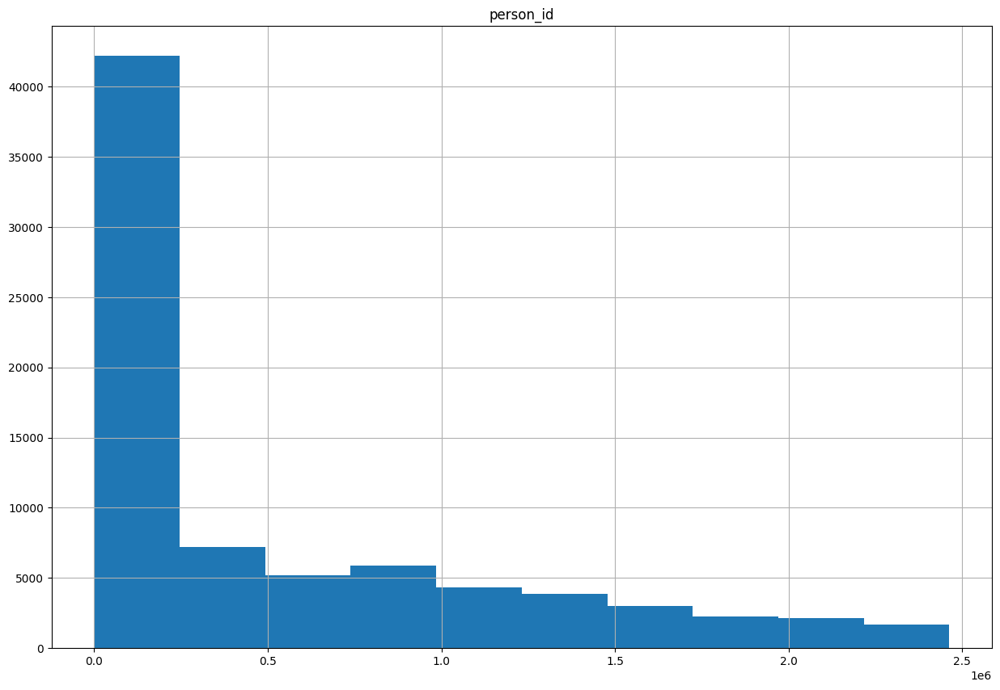

In [193]:
# Histograma credits
credits.hist(figsize = (15,10))
plt.show()

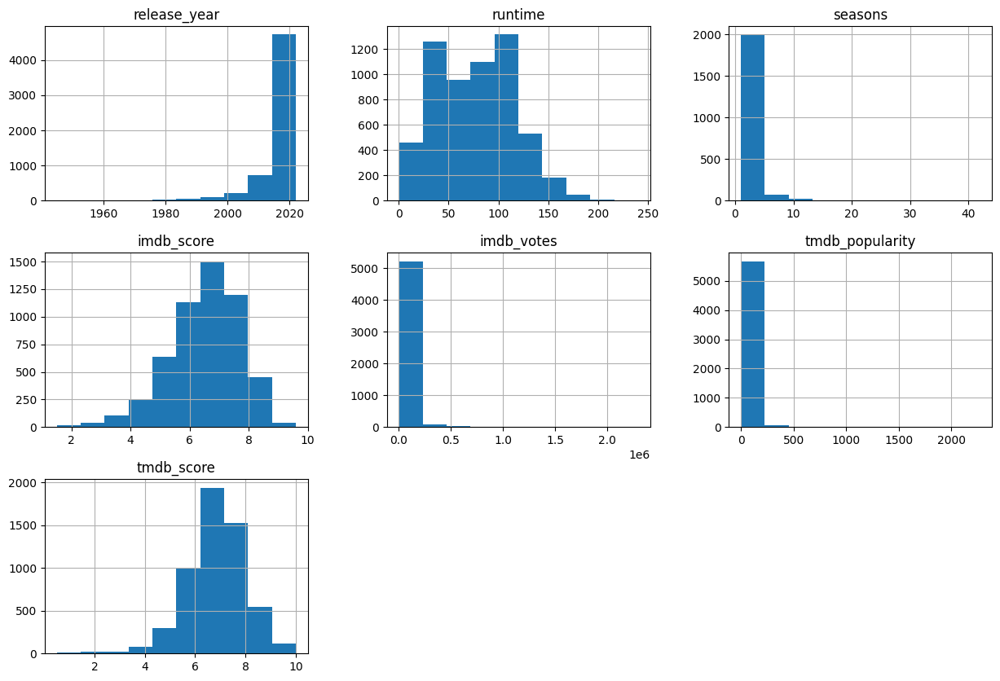

In [194]:
# Histograma titles
titles.hist(figsize = (15,10))
plt.show()

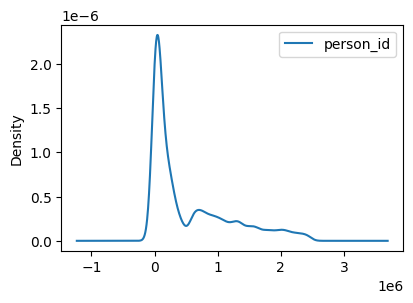

In [195]:
# Density Plot credits
credits.plot(kind = 'density', subplots = True, layout = (3,3), sharex = False, figsize = (15,10))
plt.show()

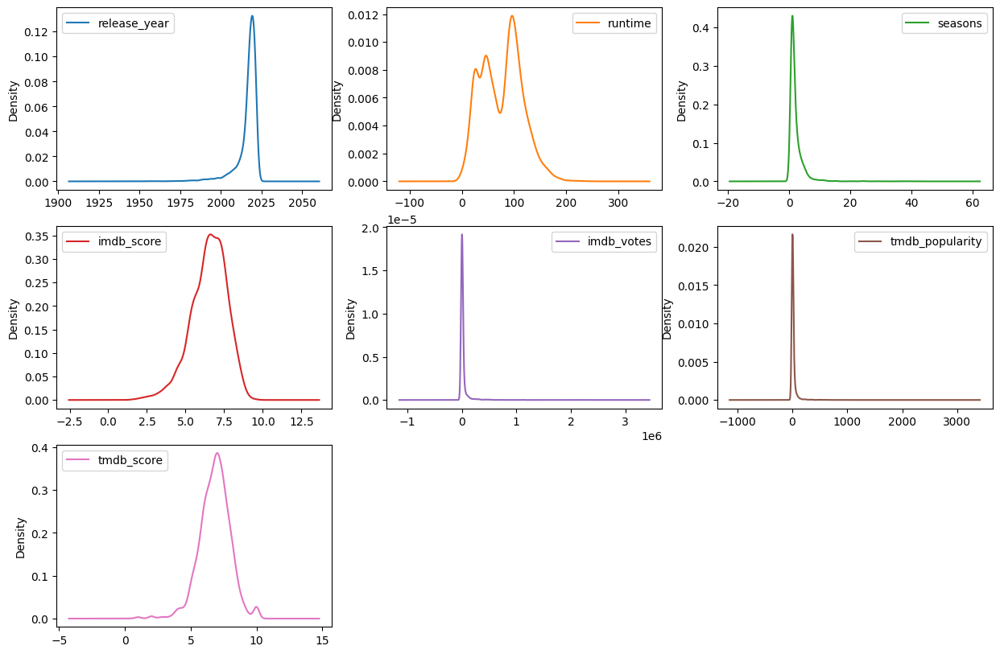

In [196]:
# Density Plot titles
titles.plot(kind = 'density', subplots = True, layout = (3,3), sharex = False, figsize = (15,10))
plt.show()

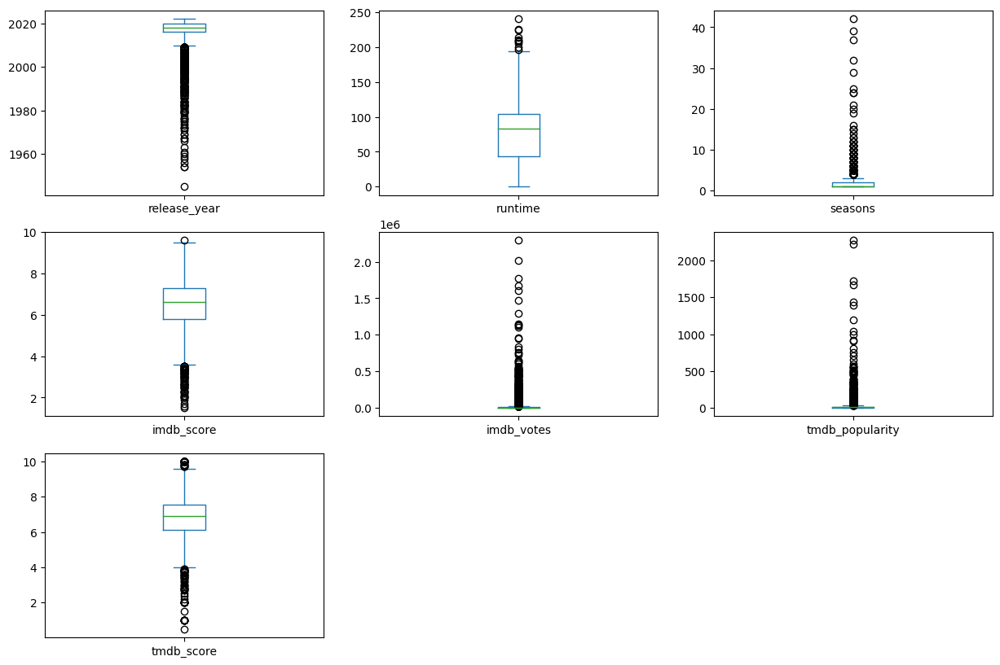

In [197]:
# Boxplot titles
titles.plot(kind = 'box', subplots = True, layout = (3,3), sharex = False, sharey = False, figsize = (15,10))
plt.show()

<h2 style="color:#034914 ;font-size: 1em "><b> 🔎 Colunas 'type' e
'age_certification'

In [198]:
cat_cols=["type","age_certification"]

In [199]:
cat_cols

['type', 'age_certification']

In [200]:
def cat_summary_with_graph(dataframe, col_name):
    fig = make_subplots(rows=1, cols=2,
                        subplot_titles=('Countplot', 'Percentages'),
                        specs=[[{"type": "xy"}, {'type': 'domain'}]])

    fig.add_trace(go.Bar(y=dataframe[col_name].value_counts().values.tolist(),
                         x=[str(i) for i in dataframe[col_name].value_counts().index],
                         text=dataframe[col_name].value_counts().values.tolist(),
                         textfont=dict(size=15),
                         name=col_name,
                         textposition='auto',
                         showlegend=True,
                         marker=dict(color=colors,
                                     line=dict(color='#DBE6EC',
                                               width=1))),
                  row=1, col=1)

    fig.add_trace(go.Pie(labels=dataframe[col_name].value_counts().keys(),
                         values=dataframe[col_name].value_counts().values,
                         textfont=dict(size=20),
                         textposition='auto',
                         showlegend=True,
                         name=col_name,
                         marker=dict(colors=colors)),
                  row=1, col=2)

    fig.update_layout(title={'text': col_name,
                             'y': 0.9,
                             'x': 0.5,
                             'xanchor': 'center',
                             'yanchor': 'top'},
                      template='plotly_white')

    iplot(fig)

In [201]:
for col in cat_cols:
    cat_summary_with_graph(titles,col)

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Top 10 países que costumam contribuir com a Netflix

<a id="8"></a>
#### <b> <span style='color:#B21010'>|</span> Transformando ocampo não informado alterando o conteudo do campo [] para [N/A]

In [202]:
#data  =  titles
#df = pd.DataFrame(titles,columns=['id','title','show_type','description','release_year','age_certification','runtime','genres','production_countries','seasons','imdb_id','imdb_score','imdb_votes','tmdb_popularity','tmdb_score'])
df = titles
df['production_countries']= df['production_countries'].replace(['[]'],['[N/A]'])
#df = df['production_countries'].replace('[]','[N/A]')

In [203]:
#titles = titles['production_countries'].replace('[]','[N/A]')
df.head(10)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
0,ts300399,Five Came Back: The Reference Films,SHOW,This collection includes 12 World War II-era p...,1945,TV-MA,51,['documentation'],['US'],1.0,NaN,NaN,NaN,0.600,NaN
1,tm84618,Taxi Driver,MOVIE,A mentally unstable Vietnam War veteran works ...,1976,R,114,"['drama', 'crime']",['US'],NaN,tt0075314,8.2,808582.0,40.965,8.179
2,tm154986,Deliverance,MOVIE,Intent on seeing the Cahulawassee River before...,1972,R,109,"['drama', 'action', 'thriller', 'european']",['US'],NaN,tt0068473,7.7,107673.0,10.010,7.300
3,tm127384,Monty Python and the Holy Grail,MOVIE,"King Arthur, accompanied by his squire, recrui...",1975,PG,91,"['fantasy', 'action', 'comedy']",['GB'],NaN,tt0071853,8.2,534486.0,15.461,7.811
4,tm120801,The Dirty Dozen,MOVIE,12 American military prisoners in World War II...,1967,NaN,150,"['war', 'action']","['GB', 'US']",NaN,tt0061578,7.7,72662.0,20.398,7.600
5,ts22164,Monty Python's Flying Circus,SHOW,A British sketch comedy series with the shows ...,1969,TV-14,30,"['comedy', 'european']",['GB'],4.0,tt0063929,8.8,73424.0,17.617,8.306
6,tm70993,Life of Brian,MOVIE,"Brian Cohen is an average young Jewish man, bu...",1979,R,94,['comedy'],['GB'],NaN,tt0079470,8.0,395024.0,17.770,7.800
7,tm14873,Dirty Harry,MOVIE,When a madman dubbed 'Scorpio' terrorizes San ...,1971,R,102,"['thriller', 'action', 'crime']",['US'],NaN,tt0066999,7.7,155051.0,12.817,7.500
8,tm119281,Bonnie and Clyde,MOVIE,"In the 1930s, bored waitress Bonnie Parker fal...",1967,R,110,"['crime', 'drama', 'action']",['US'],NaN,tt0061418,7.7,112048.0,15.687,7.500
9,tm98978,The Blue Lagoon,MOVIE,Two small children and a ship's cook survive a...,1980,R,104,"['romance', 'action', 'drama']",['US'],NaN,tt0080453,5.8,69844.0,50.324,6.156


In [204]:
df.sample(50)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
5608,tm1027297,Time,MOVIE,"Once famous for his quick blade, a retired ass...",2021,NaN,98,"['comedy', 'drama']",['HK'],NaN,NaN,NaN,NaN,1.881,7.000
5018,tm1020073,Thunder Force,MOVIE,In a world where supervillains are commonplace...,2021,PG-13,107,"['scifi', 'comedy', 'fantasy', 'action']",['US'],NaN,tt10121392,4.4,41508.0,47.631,5.700
1430,ts87884,Sons of the Caliphate,SHOW,This is a drama series about the lives of thre...,2015,TV-14,0,['drama'],['NG'],1.0,tt10202268,7.4,33.0,1.347,NaN
564,ts160526,Khawatir,SHOW,A TV show devoted to help young people to be m...,2005,TV-14,19,['reality'],[N/A],11.0,tt3062514,9.5,3115.0,NaN,NaN
599,ts23797,Black & White,SHOW,Pi Zi and Ying Xiong are two cops who are as d...,2009,TV-14,37,"['action', 'comedy', 'sport', 'crime']",['TW'],3.0,tt5295012,7.6,312.0,3.208,8.900
273,tm131038,Public Enemies,MOVIE,Depression-era bank robber John Dillinger's ch...,2009,R,140,"['action', 'crime', 'drama', 'history', 'europ...","['US', 'JP']",NaN,tt1152836,7.0,300773.0,85.039,6.700
1866,tm366567,When We First Met,MOVIE,Noah spends the perfect first night with the g...,2018,PG-13,97,"['fantasy', 'comedy', 'romance']",['US'],NaN,tt5783956,6.4,48885.0,15.879,6.600
4445,tm840208,Jeff Garlin: Our Man in Chicago,MOVIE,Comedian Jeff Garlin (unintentionally) celebra...,2019,NaN,58,['comedy'],['GB'],NaN,tt11108064,5.9,425.0,2.251,6.300
1374,ts38805,Beat Bugs,SHOW,"Jay, Kumi, Crick, Buzz, and Walter are best fr...",2016,TV-Y,15,"['family', 'animation', 'comedy', 'fantasy']",['AU'],3.0,tt4716268,7.6,524.0,6.682,6.600
2969,tm478654,Salam - The First ****** Nobel Laureate,MOVIE,"""Salam"" is a feature length documentary about ...",2018,NaN,75,['documentation'],['US'],NaN,tt7904606,7.8,418.0,1.672,7.300


<a id="9"></a>
#### <b> <span style='color:#B21010'>|</span> Mostra 50 colunas aleatórias

In [103]:
titles.sample(50)

,id,title,type,description,release_year,age_certification,runtime,genres,production_countries,seasons,imdb_id,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
2672,ts86302,Check The Store Next Door,SHOW,When a former shop owner grows bored of retire...,2018,TV-14,30,"['comedy', 'drama']",['ID'],2.0,tt9545904,7.7,138.0,2.671,6.200
5184,tm984155,The Devil Below,MOVIE,A group of four amateur adventurers who specia...,2021,R,89,"['horror', 'thriller']",['US'],NaN,tt7646322,4.2,4366.0,7.841,5.100
2985,tm480647,Ayana,MOVIE,An ambitious software entrepreneur puts everyt...,2017,NaN,128,"['drama', 'documentation']",['KG'],NaN,tt6891660,7.1,127.0,0.600,NaN
3014,tm471288,Baby Mamas,MOVIE,The daily lives and loves of four professional...,2018,NaN,93,"['comedy', 'drama']",['ZA'],NaN,tt8686460,6.6,63.0,0.641,NaN
223,ts12724,30 Rock,SHOW,"Liz Lemon, the head writer for a late-night TV...",2006,TV-14,25,"['comedy', 'sport']",['US'],7.0,tt0496424,8.3,122698.0,48.880,7.400
1040,tm183654,SDU: Sex Duties Unit,MOVIE,The Special Duties Unit (SDU) is an elite para...,2013,NaN,94,"['comedy', 'action']",['HK'],NaN,tt3044248,5.9,492.0,3.625,5.800
336,tm27268,Monster House,MOVIE,"Monsters under the bed are scary enough, but w...",2006,PG,91,"['animation', 'comedy', 'family', 'fantasy']",['US'],NaN,tt0385880,6.6,117008.0,51.891,6.600
4416,tm435327,27 Steps of May,MOVIE,"Eight years ago, 14 year old May was raped by ...",2019,NaN,112,['drama'],['ID'],NaN,tt9695156,8.0,492.0,1.857,8.600
3577,tm922532,Freaks – You're One of Us,MOVIE,After having a chance encounter with a mysteri...,2020,NC-17,93,"['fantasy', 'thriller', 'drama', 'action', 'sc...",['DE'],NaN,tt12875782,5.4,5809.0,11.865,5.700
282,tm89036,Harold & Kumar Go to White Castle,MOVIE,Nerdy accountant Harold and his irrepressible ...,2004,R,83,['comedy'],['US'],NaN,tt0366551,7.0,194695.0,15.026,6.500


In [205]:
country_count = df['production_countries'].value_counts().head(10)
fig = px.bar(y=country_count.values, 
             x=country_count.index, 
             color = country_count.index,
             color_discrete_sequence=px.colors.sequential.PuBuGn,
             text=country_count.values,
             title= 'Top 10 países que costumam contribuir com a Netflix',
             template= 'seaborn')
fig.update_layout(
    xaxis_title="Countries",
    yaxis_title="Count",
    font = dict(size=20,family="Franklin Gothic"))
fig.show()

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Distribuição da produção cinematográfica por países

In [206]:
converted_country=counco.convert(names=df["production_countries"], to="ISO3")
df["production_countries"]=converted_country

In [207]:
country=titles["production_countries"].value_counts()
fig=px.choropleth(locations=country.index,
                  color=country.values,
                  color_continuous_scale=px.colors.sequential.dense,
                  template='plotly_dark',
                  title='Distribuição de produção de filmes por País')

fig.update_layout(font=dict(size=17, family="Franklin Gothic"))
fig.show()

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Data de lançamento das séries e filmes da Netflix (1940-2021)

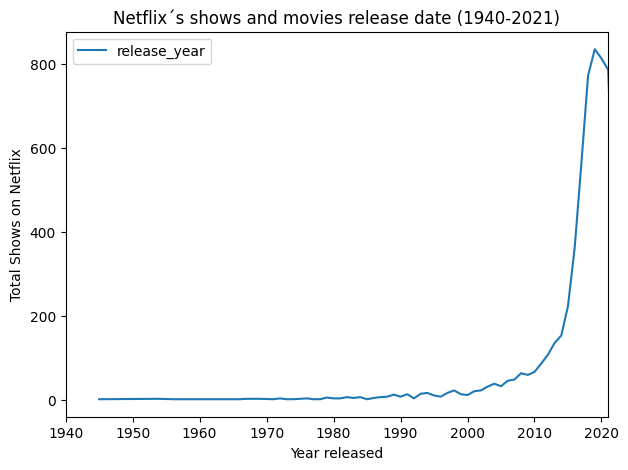

In [209]:
release_year_count=titles['release_year'].value_counts()
release_year_count=pd.DataFrame(release_year_count)

plt.figure(figsize=(7, 5))
sns.lineplot(data=release_year_count)
plt.title('Netflix´s shows and movies release date (1940-2021)')
plt.xlim(1940, 2021)
plt.xlabel('Year released')
plt.ylabel('Total Shows on Netflix')
plt.show()

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Proporção entre Filme e Show

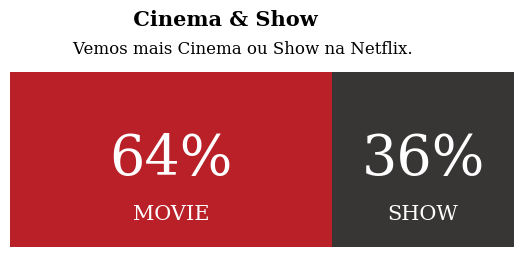

In [212]:
x=titles.groupby(['type'])['type'].count()
y=len(titles)
r=((x/y)).round(2)

mf_ratio = pd.DataFrame(r).T

fig, ax = plt.subplots(1,1,figsize=(6.5, 2.5))

ax.barh(mf_ratio.index, mf_ratio['MOVIE'], 
        color='#b20710', alpha=0.9, label='Male')
ax.barh(mf_ratio.index, mf_ratio['SHOW'], left=mf_ratio['MOVIE'], 
        color='#221f1f', alpha=0.9, label='Female')

ax.set_xlim(0, 1)
ax.set_xticks([])
ax.set_yticks([])

# movie percentage
for i in mf_ratio.index:
    ax.annotate(f"{int(mf_ratio['MOVIE'][i]*100)}%", 
                   xy=(mf_ratio['MOVIE'][i]/2, i),
                   va = 'center', ha='center',fontsize=40, fontweight='light', fontfamily='serif',
                   color='white')

    ax.annotate("MOVIE", 
                   xy=(mf_ratio['MOVIE'][i]/2, -0.25),
                   va = 'center', ha='center',fontsize=15, fontweight='light', fontfamily='serif',
                   color='white')
    
    
for i in mf_ratio.index:
    ax.annotate(f"{int(mf_ratio['SHOW'][i]*100)}%", 
                   xy=(mf_ratio['MOVIE'][i]+mf_ratio['SHOW'][i]/2, i),
                   va = 'center', ha='center',fontsize=40, fontweight='light', fontfamily='serif',
                   color='white')
    ax.annotate("SHOW", 
                   xy=(mf_ratio['MOVIE'][i]+mf_ratio['SHOW'][i]/2, -0.25),
                   va = 'center', ha='center',fontsize=15, fontweight='light', fontfamily='serif',
                   color='white')

# Title & Subtitle
fig.text(0.125,1.03,'                 Cinema & Show', fontfamily='serif',fontsize=15, fontweight='bold')
fig.text(0.125,0.92,'            Vemos mais Cinema ou Show na Netflix.',fontfamily='serif',fontsize=12)  

for s in ['top', 'left', 'right', 'bottom']:
    ax.spines[s].set_visible(False)

# Removing legend due to labelled plot
ax.legend().set_visible(False)
plt.show()

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 WordCloud de títulos

In [213]:
def Freq_df(cleanwordlist):
    Freq_dist_nltk = nltk.FreqDist(cleanwordlist)
    df_freq = pd.DataFrame.from_dict(Freq_dist_nltk, orient='index')
    df_freq.columns = ['Frequency']
    df_freq.index.name = 'Term'
    df_freq = df_freq.sort_values(by=['Frequency'],ascending=False)
    df_freq = df_freq.reset_index()
    return df_freq

def Word_Cloud(data, color_background, colormap, title):
    plt.figure(figsize = (20,15))
    wc = WordCloud(width=1200, 
               height=600, 
               max_words=50,
               colormap= colormap,
               max_font_size = 100,
               random_state=88, 
               background_color=color_background).generate_from_frequencies(data)
    plt.imshow(wc, interpolation='bilinear')
    plt.title(title, fontsize=20)
    plt.axis('off')
    plt.show()

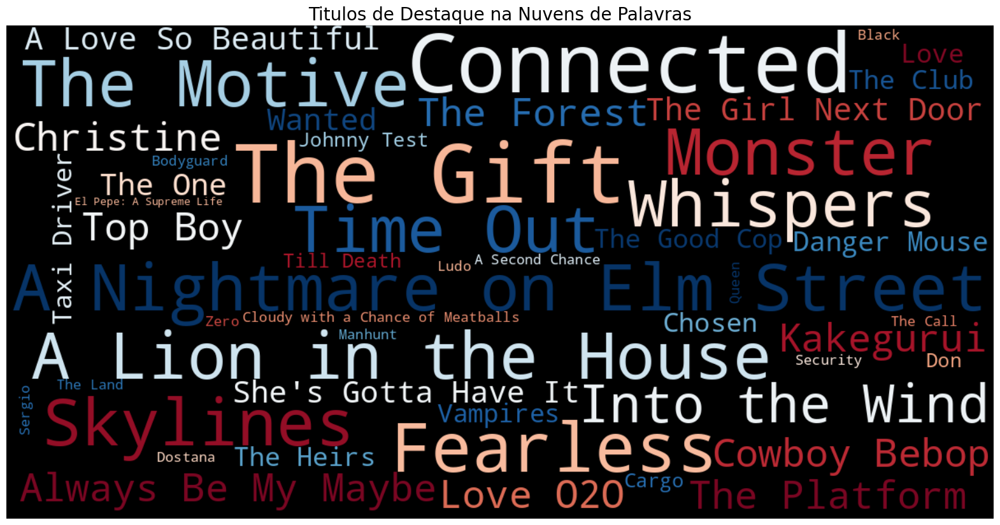

In [214]:
freq_df = Freq_df(titles['title'].values.tolist())
data = dict(zip(freq_df['Term'].tolist(), freq_df['Frequency'].tolist()))
data = freq_df.set_index('Term').to_dict()['Frequency']

Word_Cloud(data ,'black','RdBu', 'Titulos de Destaque na Nuvens de Palavras')

<a id="4.4"></a>
#### <b>4.4 <span style='color:#B21010'>|</span> Visualizações Multimodais

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Gênero por IMDB Score

In [215]:
# visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import missingno as msno
from wordcloud import WordCloud
colors = ['#494BD3', '#E28AE2', '#F1F481', '#79DB80', '#DF5F5F',
              '#69DADE', '#C2E37D', '#E26580', '#D39F49', '#B96FE3']
from plotly.offline import init_notebook_mode, iplot

df.dropna()

#genres_imdb=titles.groupby('genres')[['imdb_score']].sum().reset_index()

grouped = df.groupby(['genres'])['imdb_score'].sum().reset_index()
print(grouped.head())

display(genres_imdb)

                                              genres  imdb_score
0  ['action', 'animation', 'comedy', 'drama', 'fa...         7.7
1  ['action', 'animation', 'comedy', 'drama', 'fa...        12.5
2  ['action', 'animation', 'comedy', 'family', 'f...        14.3
3  ['action', 'animation', 'comedy', 'family', 'm...         6.0
4        ['action', 'animation', 'comedy', 'family']        20.7


,genres,imdb_score
0,"['action', 'animation', 'comedy', 'drama', 'fa...",7.7
1,"['action', 'animation', 'comedy', 'drama', 'fa...",12.5
2,"['action', 'animation', 'comedy', 'family', 'f...",14.3
3,"['action', 'animation', 'comedy', 'family', 'm...",6.0
4,"['action', 'animation', 'comedy', 'family']",20.7
...,...,...
1721,"['western', 'history', 'drama']",6.5
1722,"['western', 'horror', 'action']",6.0
1723,"['western', 'thriller', 'horror']",5.5
1724,['western'],0.0


In [216]:
fig=px.bar(x=genres_imdb["genres"],
          y=genres_imdb["imdb_score"],
          color=genres_imdb["genres"],
          color_discrete_sequence=px.colors.sequential.Plasma,
          text=genres_imdb["imdb_score"],
          title= 'Ditribuição IBMD Score por Gênero',
          template= 'plotly_dark')

fig.update_layout(xaxis_title="Genres",
                 yaxis_title="IMDB Score",
                 font=dict(size=15, family="Franklin Gothic"))

fig.show()

<ipython-input-123-9b19476f497a>:3: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



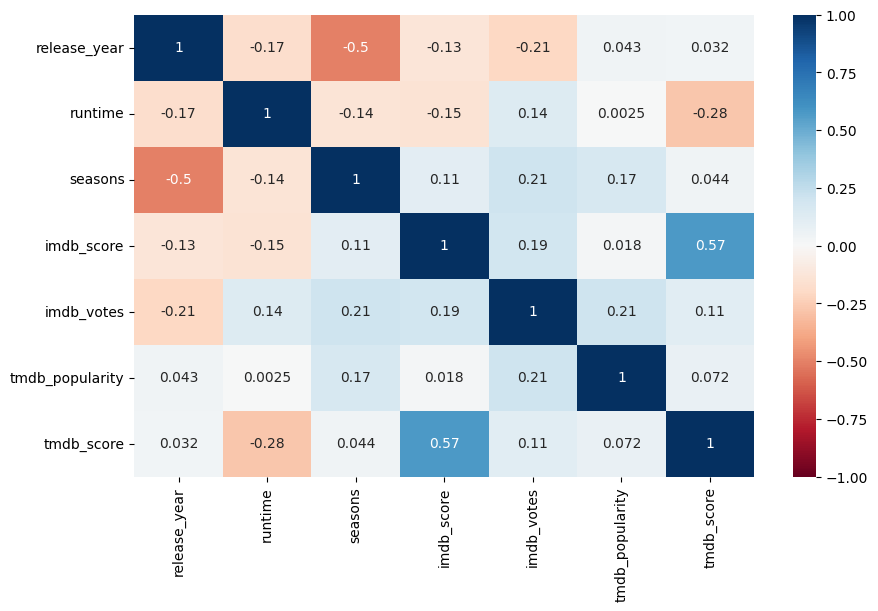

In [123]:
# Matriz de Correlação com Seaborn titles
plt.figure(figsize = (10,6))
sns.heatmap(df.corr(), annot=True, cmap='RdBu', vmin=-1, vmax=1);

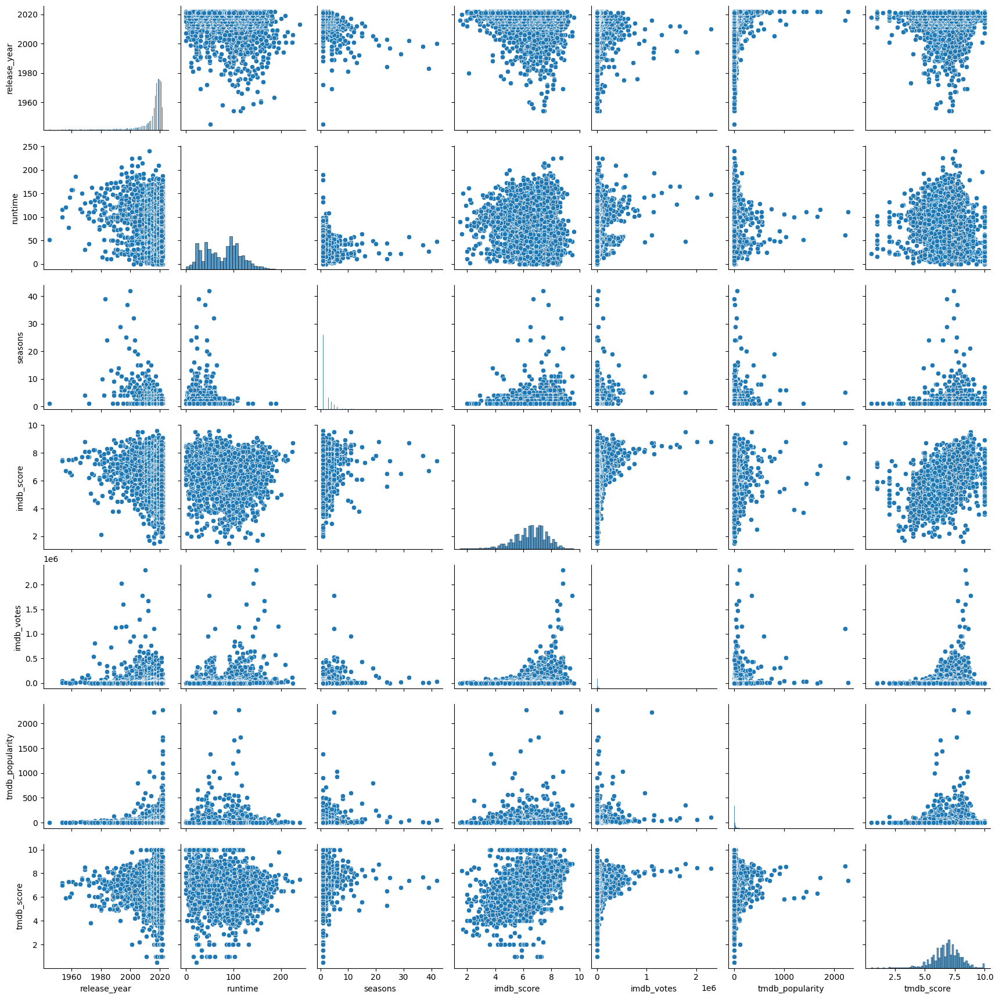

In [ ]:
# Scatter Plot com Seaborn - Variação 1
sns.pairplot(titles)

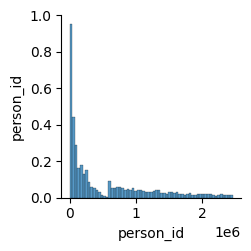

In [ ]:
# Scatter Plot com Seaborn - Variação 1
sns.pairplot(credits)

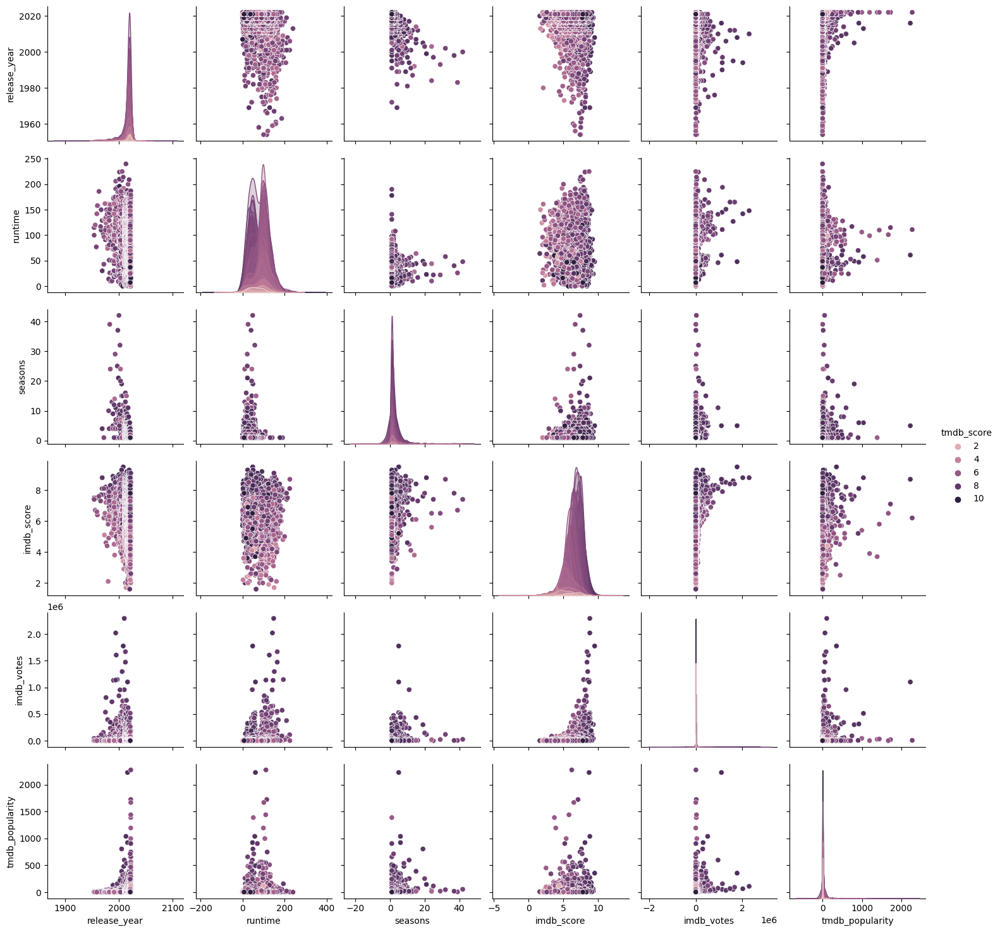

In [ ]:
# Scatter Plot com Seaborn - Variação 2
sns.pairplot(titles, hue = "tmdb_score", height = 2.5);

<a id="6.1"></a>
#### <b>6.1 <span style='color:#B21010'>|</span> Univarite Analysis

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Genres e IMDB Score

<h2 style="color:#034914 ;font-size: 1em "><b>🔎 Genres e IMDB Score

In [162]:
genres_imdb=titles.groupby('genres')[['imdb_score']].sum().reset_index()

In [167]:
fig=px.bar(x=genres_imdb["genres"],
          y=genres_imdb["imdb_score"],
          color=genres_imdb["genres"],
          color_discrete_sequence=px.colors.sequential.Plasma,
          text=genres_imdb["imdb_score"],
          title= 'Distribuicão do IBMD Score por Lista de Gênero',
          template= 'plotly_dark')

fig.update_layout(xaxis_title="Lista de Gênero",
                 yaxis_title="IMDB Score",
                 font=dict(size=15, family="Franklin Gothic"))

fig.show()

<a id="4.5"></a>
#### <b>4.5 <span style='color:#B21010'>|</span>  Outras informações úteis sobre Dataset

In [164]:
print("Forma do dataset: ", credits.shape)
print("_______________________________________")
print("Número de valores nulos: ")
print(credits.isnull().sum())
print("_______________________________________")
print("Número de valores únicos: ")
print(credits.nunique())


Forma do dataset:  (77801, 5)
_______________________________________
Número de valores nulos: 
person_id       0
id              0
name            0
character    9772
role            0
dtype: int64
_______________________________________
Número de valores únicos: 
person_id    54589
id            5489
name         54314
character    47274
role             2
dtype: int64


In [165]:
print("Forma do dataset: ", titles.shape)
print("_______________________________________")
print("Número de valores nulos: ")
print(titles.isnull().sum())
print("_______________________________________")
print("Número de valores únicos: ")
print(titles.nunique())

Forma do dataset:  (5850, 15)
_______________________________________
Número de valores nulos: 
id                         0
title                      1
type                       0
description               18
release_year               0
age_certification       2619
runtime                    0
genres                     0
production_countries       0
seasons                 3744
imdb_id                  403
imdb_score               482
imdb_votes               498
tmdb_popularity           91
tmdb_score               311
dtype: int64
_______________________________________
Número de valores únicos: 
id                      5850
title                   5798
type                       2
description             5829
release_year              63
age_certification         11
runtime                  202
genres                  1726
production_countries     452
seasons                   26
imdb_id                 5447
imdb_score                80
imdb_votes              3880
tmdb_popular

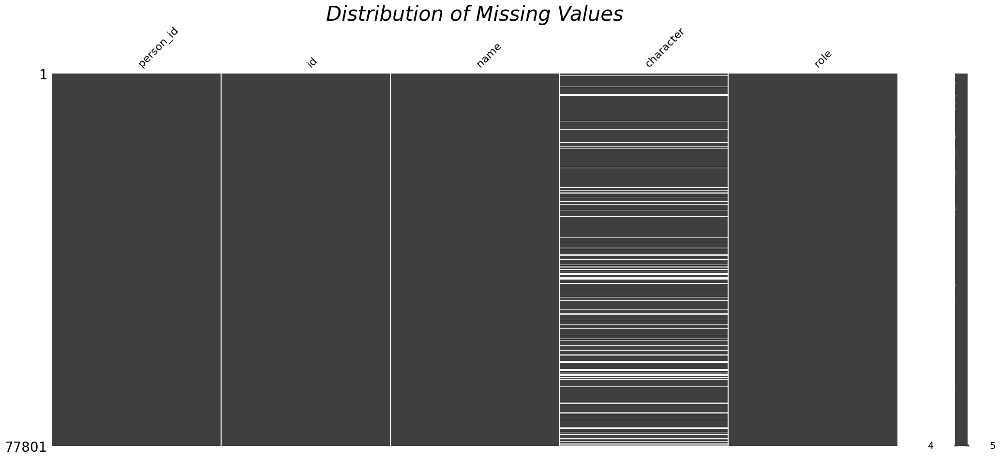

In [169]:
msno.matrix(credits)
plt.title('Distribution of Missing Values', fontsize=30, fontstyle='oblique');

<a id="4.6"></a>
## <b><span style='color:#B21010'> ||</span> Na matriz acima, percebemos visualmente que as variáveis que character_name possuem linhas brancas, logo possuem dados faltantes. 

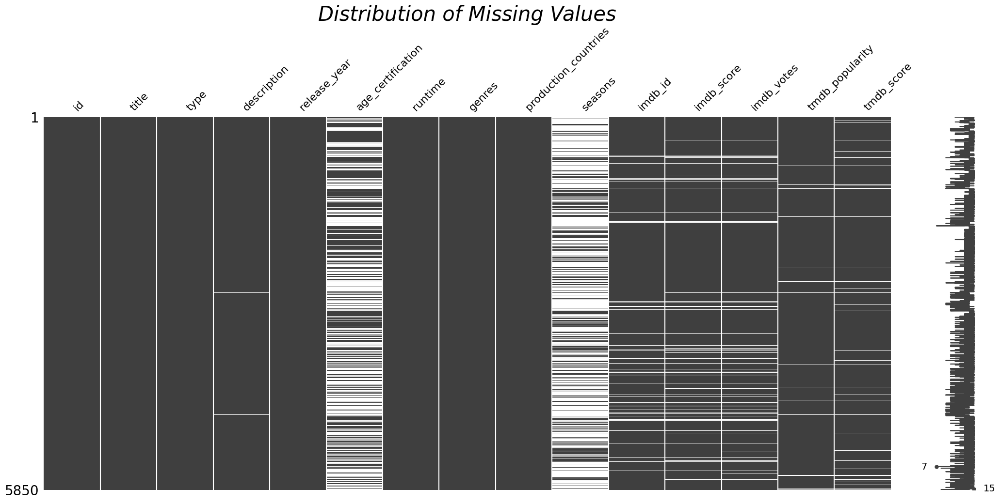

In [170]:
msno.matrix(titles)
plt.title('Distribution of Missing Values', fontsize=30, fontstyle='oblique');

<a id="4.7"></a>
## <b><span style='color:#B21010'> ||</span> Na matriz acima, percebemos visualmente que as variáveis age_certification, seasons, imdb_id, imdb_score, imdb_votes,tmdb_popularity e tmdb_score possuem linhas brancas, logo possuem dados faltantes. Além disso, como seasons possui mais linhas brancas, ele possui mais dados nulos.

<a id="4.8"></a>
#### <b>4.6 <span style='color:#B21010'>|</span> Correlação entre os Atributos

In [171]:
corr=titles.corr()
corr.style.background_gradient(cmap='Reds')

<ipython-input-171-5a5322b7081a>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



,release_year,runtime,seasons,imdb_score,imdb_votes,tmdb_popularity,tmdb_score
release_year,1.000000,-0.173551,-0.504407,-0.129380,-0.208815,0.043244,0.032073
runtime,-0.173551,1.000000,-0.139642,-0.148068,0.139760,0.002545,-0.277454
seasons,-0.504407,-0.139642,1.000000,0.106806,0.206079,0.168051,0.044023
imdb_score,-0.129380,-0.148068,0.106806,1.000000,0.190661,0.017675,0.570754
imdb_votes,-0.208815,0.139760,0.206079,0.190661,1.000000,0.209763,0.112960
tmdb_popularity,0.043244,0.002545,0.168051,0.017675,0.209763,1.000000,0.071894
tmdb_score,0.032073,-0.277454,0.044023,0.570754,0.112960,0.071894,1.000000


<a id="4.99"></a>
#### <b>4.7 <span style='color:#B21010'>  Preparação dos dados para treinarmos o Modelo de Machine Learning<a id="4.8"> 

<a id="4.99"></a>
#### <b>4.8 <span style='color:#B21010'>|</span> Separando em dados de treino e dados de teste

In [173]:
from sklearn.model_selection import train_test_split 
y = df["tmdb_score"]
x = df.drop("tmdb_score", axis=1)

x_treino, x_teste, y_treino, y_teste = train_test_split(x, y, test_size=0.3, random_state=1)

<a id="4.99"></a>
#### <b>4.8 <span style='color:#B21010'> Temos um problema de regressão - Vamos escolher os modelos que vamos usar:

*  Regressão Linear
*  RandomForest (Árvore de Decisão) 

In [174]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

# cria as inteligencias aritificiais
modelo_regressaolinear = LinearRegression()
modelo_arvoredecisao = RandomForestRegressor()

# treina as inteligencias artificias
modelo_regressaolinear.fit(x_treino, y_treino)
modelo_arvoredecisao.fit(x_treino, y_treino)

ValueError: ignored

## Pandas Profiling

<a id="4.8"></a>
#### <b>4.6 <span style='color:#B21010'>|</span> C
#### <b>4.6 <span style='color:#B21010'>|</span> Correlação entre os Atributos

In [ ]:
c

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 22.0 MB 41.4 MB/s 
     |████████████████████████████████| 102 kB 11.8 MB/s 
     |████████████████████████████████| 690 kB 54.4 MB/s 
     |████████████████████████████████| 4.7 MB 53.1 MB/s 
     |████████████████████████████████| 62 kB 1.4 MB/s 
     |████████████████████████████████| 9.8 MB 47.9 MB/s 
     |████████████████████████████████| 296 kB 51.4 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.3.0-py2.py3-none-any.whl size=268032 sha256=0ba13600dbdeeaa4c5c8821c4a3fe05e64eb80ede7b398a0897f949ff41becc7
  Stored in directory: /tmp/pip-ephem-wheel-cache-qntxqz0m/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=4b578925002d06276f856fa76da5390895811afa9417bfc019f7c173063f7e03
  Stored in directory: /root/.cache/pip/wh

In [ ]:
# imports necessários
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport

In [ ]:
# geração do report
profile = ProfileReport(dataset, title='Pandas Profiling Report', html={'style':{'full_width':False}})
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
# exportação do report
profile.to_file(output_file="Report-Diabetes.html")

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]